# **Email Spam Classifier Using LSTM with Word2Vec Embeddings**
---

# **Install** and Import Required **Libraries**



In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from gensim.models import Word2Vec
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from wordcloud import WordCloud
from collections import Counter

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# **Load Dataset**

In [2]:
df = pd.read_csv('combined_data.csv')

In [3]:
df.head()

,label,text
0,1,ounce feather bowl hummingbird opec moment ala...
1,1,wulvob get your medircations online qnb ikud v...
2,0,computer connection from cnn com wednesday es...
3,1,university degree obtain a prosperous future m...
4,0,thanks for all your answers guys i know i shou...


# **Exploratory Data Analysis (EDA)**

1.   Basic Dataset Overview



In [4]:
df.shape # Shape of the Dataset

(83448, 2)

In [5]:
df.isnull().sum() # Missing Values

label    0
text     0
dtype: int64

In [6]:
df.duplicated().sum() # Duplicate Values

0

In [7]:
df.dtypes # Data Types

label     int64
text     object
dtype: object

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83448 entries, 0 to 83447
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   label   83448 non-null  int64 
 1   text    83448 non-null  object
dtypes: int64(1), object(1)
memory usage: 1.3+ MB


In [9]:
df.describe()

,label
count,83448.000000
mean,0.526196
std,0.499316
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,1.000000


2.   Class Distribution



In [10]:
# Preparing the data
class_counts = df['label'].value_counts().reset_index()
class_counts.columns = ['label', 'count']
class_counts['label'] = class_counts['label'].map({0: 'Ham', 1: 'Spam'})

# Creating the bar chart with enhanced visuals
fig = px.bar(
    class_counts,
    x='label',
    y='count',
    color='label',
    color_discrete_sequence=['#1f77b4', '#ff7f0e'],  
    title="<b>Class Distribution: Spam vs. Ham</b>",  
    text='count',
)

fig.update_traces(
    textfont_size=14,
    textposition='outside',
    marker_line_color='rgb(8,48,107)',
    marker_line_width=2.5, 
    opacity=0.85  
)

fig.update_layout(
    title=dict(
        font=dict(size=28, color='darkblue', family="Arial Black, sans-serif"),
        x=0.5,  # Center the title
        xanchor='center'
    ),
    xaxis_title="<b>Class</b>",
    yaxis_title="<b>Count</b>",
    xaxis=dict(
        titlefont_size=18,
        tickfont_size=16,
    ),
    yaxis=dict(
        titlefont_size=18,
        tickfont_size=16,
        gridcolor='lightgrey'  # Light grid lines for a cleaner look
    ),
    font=dict(
        family="Arial, sans-serif",
        size=16,
        color="black"
    ),
    plot_bgcolor='rgba(0,0,0,0)',  # Transparent background for a sleek look
    paper_bgcolor='rgba(255,255,255,1)',  # Clean white background
)

# Adding annotations for extra clarity 
fig.add_annotation(
    text="Ham: Legitimate Emails<br>Spam: Unwanted Emails",
    xref="paper", yref="paper",
    x=1, y=1, showarrow=False,
    font=dict(size=14, color="grey"),
    align="right",
)

# Show the plot
fig.show()

In [11]:
# Prepare the data for a bubble chart
spam_percentage = df['label'].value_counts(normalize=True) * 100
spam_percentage = spam_percentage.reset_index()
spam_percentage.columns = ['label', 'percentage']
spam_percentage['label'] = spam_percentage['label'].map({0: 'Ham', 1: 'Spam'})

# Create a bubble chart
fig = px.scatter(
    spam_percentage,
    x='label',
    y='percentage',
    size='percentage',
    color='label',
    color_discrete_sequence=['blue', 'orange'],
    size_max=60,
    title="<b>Class Distribution: Spam vs. Ham</b>",
    labels={'percentage': 'Percentage'}
)

# Update layout for a more polished look
fig.update_layout(
    title=dict(
        font=dict(size=30, color='black', family="Arial Black, sans-serif"),
        x=0.5,
        xanchor='center'
    ),
    xaxis_title="<b>Class</b>",
    yaxis_title="<b>Percentage</b>",
    xaxis=dict(
        titlefont_size=18,
        tickfont_size=16,
    ),
    yaxis=dict(
        titlefont_size=18,
        tickfont_size=16,
        gridcolor='lightgrey',
        gridwidth=1
    ),
    font=dict(
        family="Arial, sans-serif",
        size=16,
        color="black"
    ),
    plot_bgcolor='rgba(255,255,255,0.8)',
    paper_bgcolor='rgba(255,255,255,1)',
    margin=dict(l=40, r=40, t=40, b=40),
)

# Show the plot
fig.show()

3.   Text Data Exploration

<Axes: title={'center': 'Distribution of Email Lengths'}, ylabel='Frequency'>

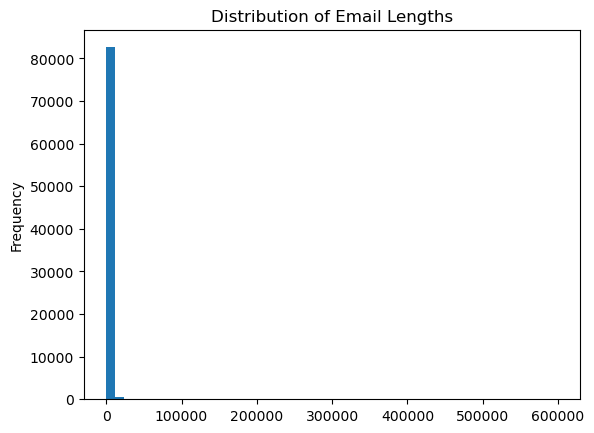

In [12]:
df['email_length'] = df['text'].apply(len)
df['email_length'].plot(kind='hist', bins=50, title="Distribution of Email Lengths")

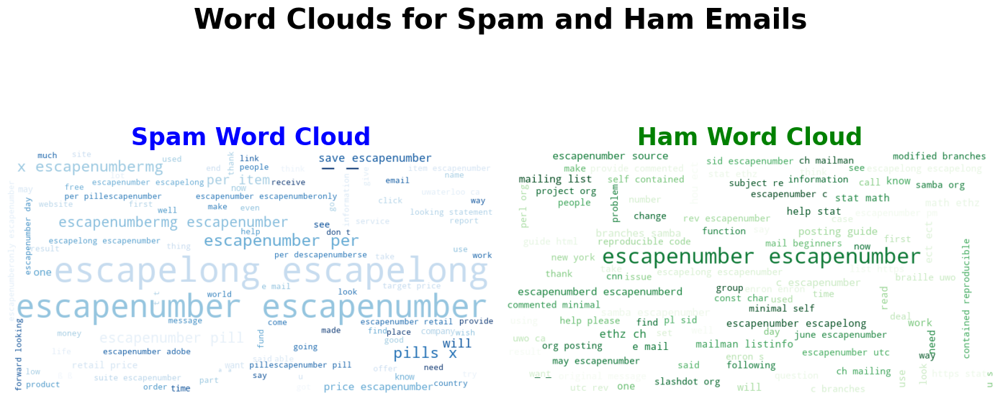

In [13]:
# Combine text for spam and ham emails
spam_words = ' '.join(df[df['label'] == 1]['text'])
ham_words = ' '.join(df[df['label'] == 0]['text'])

# Create WordCloud objects
spam_wc = WordCloud(
    width=800,
    height=400,
    max_words=100,
    background_color='white',
    colormap='Blues'
).generate(spam_words)

ham_wc = WordCloud(
    width=800,
    height=400,
    max_words=100,
    background_color='white',
    colormap='Greens'
).generate(ham_words)

# Plot the word clouds
plt.figure(figsize=(14, 7))

# Plot Spam Word Cloud
plt.subplot(1, 2, 1)
plt.imshow(spam_wc, interpolation='bilinear')
plt.axis('off')
plt.title("Spam Word Cloud", fontsize=24, fontweight='bold', color='blue')

# Plot Ham Word Cloud
plt.subplot(1, 2, 2)
plt.imshow(ham_wc, interpolation='bilinear')
plt.axis('off')
plt.title("Ham Word Cloud", fontsize=24, fontweight='bold', color='green')

# Add a main title
plt.suptitle("Word Clouds for Spam and Ham Emails", fontsize=28, fontweight='bold', color='black')

# Adjust layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Show the plot
plt.show()

4.   Most Frequent Words

In [14]:
# Combine text for spam and ham emails and split into words
spam_words = ' '.join(df[df['label'] == 1]['text']).split()
ham_words = ' '.join(df[df['label'] == 0]['text']).split()

# Count word frequencies
spam_word_freq = Counter(spam_words)
ham_word_freq = Counter(ham_words)

def words_to_df(word_freq, label):
    """Convert word frequencies to DataFrame."""
    return pd.DataFrame(word_freq.most_common(20), columns=['Word', 'Frequency']).assign(Label=label)

# Convert word frequencies to DataFrames
spam_word_freq_df = words_to_df(spam_word_freq, 'Spam')
ham_word_freq_df = words_to_df(ham_word_freq, 'Ham')

# Combine DataFrames
word_freq_df = pd.concat([spam_word_freq_df, ham_word_freq_df])

# Create bar plot
fig = px.bar(
    word_freq_df,
    x='Word',
    y='Frequency',
    color='Label',
    title="<b>Top 20 Words in Spam vs. Ham Emails</b>",
    labels={'Word': 'Word', 'Frequency': 'Frequency'},
    color_discrete_sequence=['#1f77b4', '#ff7f0e']  
)

# Update layout for better presentation
fig.update_layout(
    title=dict(
        font=dict(size=30, color='black', family="Arial Black, sans-serif"),
        x=0.5,
        xanchor='center'
    ),
    xaxis_title="<b>Word</b>",
    yaxis_title="<b>Frequency</b>",
    xaxis=dict(
        titlefont_size=18,
        tickfont_size=14,
        tickangle=45  
    ),
    yaxis=dict(
        titlefont_size=18,
        tickfont_size=14,
        gridcolor='lightgrey',
        gridwidth=1
    ),
    font=dict(
        family="Arial, sans-serif",
        size=16,
        color="black"
    ),
    plot_bgcolor='rgba(255,255,255,0.8)',
    paper_bgcolor='rgba(255,255,255,1)',
    margin=dict(l=40, r=40, t=40, b=100)  
)

# Show the plot
fig.show()

5.   N-gram Analysis

In [15]:
# Function to get top n-grams (in this case, bigrams)
def get_top_ngrams(corpus, n=2, top_k=20):
    vec = CountVectorizer(ngram_range=(n, n)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
    return words_freq[:top_k]

# Extract top bigrams for spam and ham emails
spam_bigrams = get_top_ngrams(df[df['label'] == 1]['text'], n=2)
ham_bigrams = get_top_ngrams(df[df['label'] == 0]['text'], n=2)

# Function to convert bigram list to DataFrame
def bigrams_to_df(bigrams, label):
    """Convert bigram list to DataFrame."""
    return pd.DataFrame(bigrams, columns=['Bigram', 'Frequency']).assign(Label=label)

# Convert bigrams to DataFrames
spam_bigrams_df = bigrams_to_df(spam_bigrams, 'Spam')
ham_bigrams_df = bigrams_to_df(ham_bigrams, 'Ham')

# Combine DataFrames
bigrams_df = pd.concat([spam_bigrams_df, ham_bigrams_df])

# Create a bar plot
fig = px.bar(
    bigrams_df,
    x='Bigram',
    y='Frequency',
    color='Label',
    title="<b>Top Bigrams in Spam vs. Ham Emails</b>",
    labels={'Bigram': 'Bigram', 'Frequency': 'Frequency'},
    color_discrete_sequence=['#1f77b4', '#ff7f0e']  # Colors for Spam and Ham
)

# Update layout for better presentation
fig.update_layout(
    title=dict(
        font=dict(size=30, color='black', family="Arial Black, sans-serif"),
        x=0.5,
        xanchor='center'
    ),
    xaxis_title="<b>Bigram</b>",
    yaxis_title="<b>Frequency</b>",
    xaxis=dict(
        titlefont_size=18,
        tickfont_size=14,
        tickangle=45 
    ),
    yaxis=dict(
        titlefont_size=18,
        tickfont_size=14,
        gridcolor='lightgrey',
        gridwidth=1
    ),
    font=dict(
        family="Arial, sans-serif",
        size=16,
        color="black"
    ),
    plot_bgcolor='rgba(255,255,255,0.8)',
    paper_bgcolor='rgba(255,255,255,1)',
    margin=dict(l=40, r=40, t=40, b=100) 
)

# Show the plot
fig.show()

6.   Correlation Analysis

In [58]:
# Create scatter plot with regression line
fig = px.scatter(
    df,
    x='email_length',
    y='label',
    trendline='ols',  # Ordinary Least Squares regression line
    title="<b>Scatter Plot of Email Length vs. Spam Label</b>",
    labels={'email_length': 'Email Length', 'label': 'Label'},
    color='label',
    color_continuous_scale=['blue', 'orange']
)

# Update layout for better presentation
fig.update_layout(
    title=dict(
        font=dict(size=30, color='black', family="Arial Black, sans-serif"),
        x=0.5,
        xanchor='center'
    ),
    xaxis_title="<b>Email Length</b>",
    yaxis_title="<b>Spam Label</b>",
    xaxis=dict(
        titlefont_size=18,
        tickfont_size=14
    ),
    yaxis=dict(
        titlefont_size=18,
        tickfont_size=14
    ),
    font=dict(
        family="Arial, sans-serif",
        size=16,
        color="black"
    ),
    plot_bgcolor='rgba(255,255,255,0.8)',
    paper_bgcolor='rgba(255,255,255,1)',
    margin=dict(l=40, r=40, t=40, b=40)
)

# Show the plot
fig.show()

In [17]:
df.head()

,label,text,email_length
0,1,ounce feather bowl hummingbird opec moment ala...,148
1,1,wulvob get your medircations online qnb ikud v...,808
2,0,computer connection from cnn com wednesday es...,2235
3,1,university degree obtain a prosperous future m...,592
4,0,thanks for all your answers guys i know i shou...,1362


In [18]:
df.shape

(83448, 3)

# **Text Preprocessing**

In [19]:
import re
import string
import nltk
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.tokenize import word_tokenize

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\hp\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [20]:
# Initialize the stemmer and lemmatizer
stemmer = PorterStemmer()
lemmatizer = WordNetLemmatizer()

# Define stopwords
stop_words = set(stopwords.words('english'))

# Preprocessing function
def preprocess_text(text):
    # Convert text to lowercase
    text = text.lower()
    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    # Remove special characters
    text = re.sub(r'\W', ' ', text)
    # Tokenization
    words = word_tokenize(text)
    # Remove stopwords and apply stemming/lemmatization
    words = [lemmatizer.lemmatize(stemmer.stem(word)) for word in words if word not in stop_words]
    return ' '.join(words)

In [21]:
# Apply preprocessing
df['text'] = df['text'].apply(preprocess_text)

# **Prepare Data for Word2Vec and LSTM**

In [22]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical

In [23]:
# Convert labels to categorical (not necessary in this case since it's binary, but keeping for reference)
y = df['label'].values

In [24]:
# Tokenization and padding
max_vocab_size = 10000
max_sequence_length = 100

In [25]:
tokenizer = Tokenizer(num_words=max_vocab_size)
tokenizer.fit_on_texts(df['text'])
sequences = tokenizer.texts_to_sequences(df['text'])

In [26]:
word_index = tokenizer.word_index
vocab_size = min(max_vocab_size, len(word_index) + 1)

X = pad_sequences(sequences, maxlen=max_sequence_length)

In [27]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [28]:
# Train Word2Vec model on text
sentences = [text.split() for text in df['text']]
word2vec_model = Word2Vec(sentences, vector_size=100, window=5, min_count=1, workers=4)

In [29]:
# Prepare the embedding matrix
embedding_dim = 100
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in word_index.items():
    if i < vocab_size:
        try:
            embedding_vector = word2vec_model.wv[word]
            embedding_matrix[i] = embedding_vector
        except KeyError:
            pass

# **Build and Train the LSTM Model**

In [30]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout

# Build the LSTM model
model = Sequential()
model.add(Embedding(input_dim=vocab_size,
                    output_dim=embedding_dim,
                    weights=[embedding_matrix],
                    trainable=False))
model.add(LSTM(128, return_sequences=False))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))  # Change to 1 output neuron for binary classification

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train,
          batch_size=64,
          epochs=5,
          validation_data=(X_test, y_test),
          verbose=1)

Epoch 1/5
1044/1044 ━━━━━━━━━━━━━━━━━━━━ 149s 137ms/step - accuracy: 0.9448 - loss: 0.1418 - val_accuracy: 0.9851 - val_loss: 0.0456
Epoch 2/5
1044/1044 ━━━━━━━━━━━━━━━━━━━━ 147s 141ms/step - accuracy: 0.9858 - loss: 0.0443 - val_accuracy: 0.9895 - val_loss: 0.0339
Epoch 3/5
1044/1044 ━━━━━━━━━━━━━━━━━━━━ 151s 145ms/step - accuracy: 0.9885 - loss: 0.0354 - val_accuracy: 0.9878 - val_loss: 0.0346
Epoch 4/5
1044/1044 ━━━━━━━━━━━━━━━━━━━━ 153s 146ms/step - accuracy: 0.9921 - loss: 0.0248 - val_accuracy: 0.9894 - val_loss: 0.0309
Epoch 5/5
1044/1044 ━━━━━━━━━━━━━━━━━━━━ 150s 143ms/step - accuracy: 0.9931 - loss: 0.0218 - val_accuracy: 0.9908 - val_loss: 0.0303


# **Evaluate the Model**

In [38]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test)

522/522 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.9917 - loss: 0.0274


In [55]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create subplots: 1 row, 2 columns
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "indicator"}, {"type": "indicator"}]])

# Gauge for Test Accuracy
fig.add_trace(go.Indicator(
    mode="gauge+number",
    value=test_accuracy,
    title={'text': "Test Accuracy", 'font': {'size': 20}},
    gauge={'axis': {'range': [0, 1], 'tickwidth': 1, 'tickcolor': "darkblue"},
           'bar': {'color': "#1f77b4"},
           'bgcolor': "white",
           'borderwidth': 2,
           'bordercolor': "gray",
           'steps': [{'range': [0, 0.5], 'color': '#ffcccc'},
                     {'range': [0.5, 0.75], 'color': '#ffb3b3'},
                     {'range': [0.75, 1], 'color': '#ff9999'}],
           'threshold': {'line': {'color': "red", 'width': 4}, 'thickness': 0.75, 'value': test_accuracy}}),
    row=1, col=1)

# Gauge for Test Loss
fig.add_trace(go.Indicator(
    mode="gauge+number",
    value=test_loss,
    title={'text': "Test Loss", 'font': {'size': 20}},
    gauge={'axis': {'range': [0, max(test_loss, 1)], 'tickwidth': 1, 'tickcolor': "darkblue"},
           'bar': {'color': "#ff7f0e"},
           'bgcolor': "white",
           'borderwidth': 2,
           'bordercolor': "gray",
           'steps': [{'range': [0, 0.5], 'color': '#ccffcc'},
                     {'range': [0.5, 1], 'color': '#b3ffb3'},
                     {'range': [1, max(test_loss, 2)], 'color': '#99ff99'}],
           'threshold': {'line': {'color': "red", 'width': 4}, 'thickness': 0.75, 'value': test_loss}}),
    row=1, col=2)

# Layout configuration
fig.update_layout(
    title_text="Model Evaluation Metrics",
    font=dict(size=16),
    paper_bgcolor="white",
    plot_bgcolor='white',
    height=400
)

# Show the plot
fig.show()

# **Make Predictions on New Data**

In [56]:
import plotly.graph_objects as go

def classify_email(user_input, tokenizer, model, max_sequence_length):
    """Classify the email and return the result and confidence level."""
    # Preprocess user input
    new_sequence = tokenizer.texts_to_sequences([user_input])
    new_padded_sequence = pad_sequences(new_sequence, maxlen=max_sequence_length)

    # Model prediction
    predicted_probability = model.predict(new_padded_sequence)

    # Convert prediction to class
    if predicted_probability.ndim == 2 and predicted_probability.shape[1] == 1:
        predicted_class = int(predicted_probability.round().item())  # Rounding to get 0 or 1
    else:
        raise ValueError("Unexpected shape of predicted_probability")

    confidence = predicted_probability[0][0]
    return 'spam' if predicted_class == 1 else 'ham', confidence

def plot_classification_result(result, confidence):
    """Display the classification result using a Plotly gauge chart."""
    fig = go.Figure()

    # Add a gauge chart for confidence
    fig.add_trace(go.Indicator(
        mode="gauge+number",
        value=confidence * 100,
        title={'text': f"Confidence Level", 'font': {'size': 24, 'color': 'black'}},
        gauge={
            'axis': {'range': [0, 100], 'tickcolor': 'black', 'tickwidth': 2},
            'bar': {'color': '#1f77b4'},
            'steps': [
                {'range': [0, 50], 'color': 'lightgray'},
                {'range': [50, 100], 'color': '#1f77b4'}
            ],
            'threshold': {
                'line': {'color': 'red', 'width': 4},
                'value': confidence * 100
            }
        },
        number={'prefix': "%", 'font': {'size': 36, 'color': '#1f77b4'}}
    ))

    # Update layout for better presentation
    fig.update_layout(
        title=dict(
            text=f"<b>The email is classified as <span style='color: {'#FF6347' if result == 'spam' else '#4CAF50'}'>{result.upper()}</span></b>",
            font=dict(size=24, color='black', family="Arial Black, sans-serif"),
            x=0.5,
            xanchor='center'
        ),
        showlegend=False,
        plot_bgcolor='rgba(255,255,255,1)',
        paper_bgcolor='rgba(255,255,255,1)',
        annotations=[
            dict(
                x=0.5,
                y=-0.2,
                text=f"<b>Confidence:</b> {confidence * 100:.2f}%",
                font=dict(size=18, color='black'),
                showarrow=False,
                xanchor='center'
            )
        ],
        height=400 
    )

    # Show the plot
    fig.show()

# Define max_sequence_length (this should match the length used during training)
max_sequence_length = 100 

# Get user input
user_input = input("Enter the email text for classification: ")

# Classify the email
result, confidence = classify_email(user_input, tokenizer, model, max_sequence_length)

# Display the result with Plotly gauge chart
plot_classification_result(result, confidence)

Enter the email text for classification: Hi John,  I wanted to let you know that our meeting scheduled for this Thursday has been moved to next Tuesday at 10 AM. Please let me know if this new time works for you.  Looking forward to our discussion.  Best Regards, Sarah
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


In [57]:
import tensorflow as tf
import pickle

# Save model in the Keras format
model.save('lstm_spam_classifier.keras')

# Save the tokenizer
with open('tokenizer.pkl', 'wb') as file:
    pickle.dump(tokenizer, file)